# IRIS SECTION 

In [1]:
import numpy as np
import importlib
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import svm   
importlib.reload(svm)

iris = load_iris()
binary_mask = (iris.target == 0) | (iris.target == 1)

X_binary = iris.data[binary_mask, :2]
y_raw_binary = iris.target[binary_mask] 

X = X_binary
y = y_raw_binary

X, y = svm._check_X_y(X, y)


In [12]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=50,          # 6 gives a wide margin, 13 gives a slightly smaller margin
    learning_rate=0.01, # Significantly increase learning rate
    n_epochs=5000,   # 500 is the sweet spot for 6
                  
    batch_size=32, ## Batch size changes the boundary line quite a lot
    verbose=True
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")


Starting Training...
[-2.19226649  2.24858687 -2.06244458  2.84369473  2.7219186   3.04360984
 -2.35597563  2.48409337  2.79371596 -2.31806551  2.90574216  2.53004926
  2.27442834 -1.88666679 -2.19226649 -2.11242336 -2.00039715 -2.10035471
 -2.38986287 -1.93664556 -2.1882436   2.94365228 -2.02051158  2.7219186
  2.6518254   2.85576339 -2.00844292 -2.11644624  2.53407215  2.67193982
  2.70010001  2.58807381]
[ -9.25976811  -9.70913677 -10.26597731  10.03155242  10.92851872
  -9.37078202  -9.14344117  -9.70205273  10.25180922   9.13812814
 -10.38053324   8.79623136   7.90989113   9.91699649  11.59460216
   9.9187675    9.80598258   8.57420355  10.70117788  -9.59458084
  -9.0377403    9.9187675    9.24914204   9.92053851  -9.81837967
 -11.72863922   9.46939884   9.47294087   9.69673969 -11.5048404
  10.47915006  10.14610835]
[ 2.70875389  1.91720699  2.29508041  2.00670369 -1.50949676  2.68289714
 -1.87742686  2.25132708 -1.55524013 -1.5353535  -1.66860353  2.13796368
 -1.47966682  2.273


Plotting Decision Boundary...


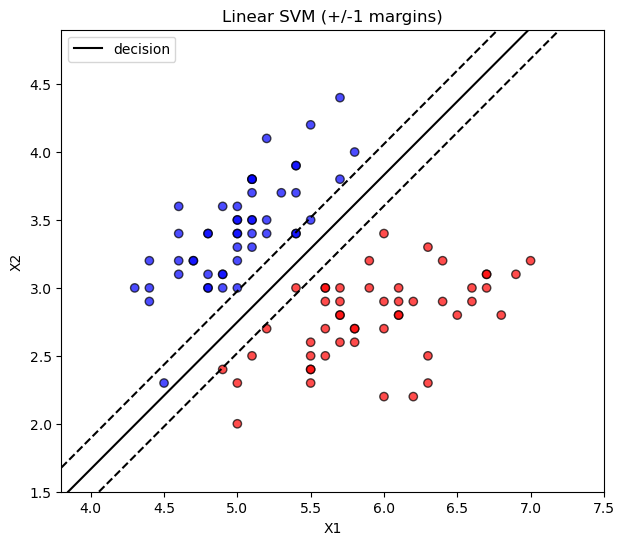

In [13]:
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)

# BLOB GRAPHS

In [14]:
### MAKE_BLOBS creates gaussian distribution with set hyperparameters for the standard deviation
from sklearn.datasets import make_blobs

X_blobs, y_blobs = make_blobs(
    n_samples=500,        
    n_features=2,         # Dimenstions
    centers=2,            # Number of centers/clusters to generate
                          # 0,1
    cluster_std=2.5,      
                          # We can maybe expirement with this. Maybe a range from (0.5  to 4) for
                          # seeing how well it does with varying seperability.  
    random_state=42       
)

print("Shape of X_blobs:", X_blobs.shape)
print("Shape of y_blobs:", y_blobs.shape)

X,y = svm._check_X_y(X_blobs,y_blobs)

Shape of X_blobs: (500, 2)
Shape of y_blobs: (500,)



Starting Training...
[ 6.70790739  2.53628946  6.44070471  3.33407831 -1.46176016 -1.53635431
  5.38434825 -0.82068082  0.33996891  7.26527513  6.46235323  0.60959873
 -1.28143389  6.88397726 -0.08911647  5.7486417  -0.70682691  6.56066884
  7.6951614   7.57910636 -1.55207714  1.16573478  4.21043234  7.6207835
  8.03562379  8.32985862  5.86446833  3.84655323  6.69708648  4.03080799
  0.35224845  5.14306198]
[ 1.77188908  1.59579209  2.52592362  2.93416737  4.14695502  7.59234733
  4.71002344  6.25834942  3.64050847  1.57488826  4.49994128  3.72219476
  0.94703596  4.70016517  3.48569158  6.66246693  6.89752677  1.63215594
  4.57639643  1.41877345  0.37746184  5.40248132 -0.42265072  0.40740681
  6.22746554  1.56362059  3.50213546  3.23532354  5.07687783  6.23258308
  4.79740806  4.9117651 ]
[ 3.26210453  5.7747148   2.23060601  1.42285896  1.32538049  3.96007265
  4.16775143  2.87348301  6.09409892  4.73717202  4.35150031 -0.79595867
  2.37376423  3.1936412   0.03669476  2.92160121 -0

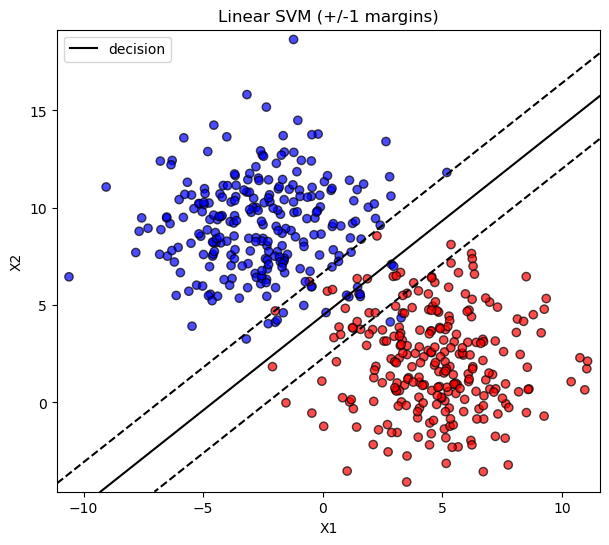

In [15]:
#for different experiments we will update the config 
config = svm.LinearSVMConfig(
    C=13.0,           
    learning_rate=0.01, 
    n_epochs=500,   # Increase the number of steps
    batch_size=32,
    verbose=True,
    random_state=10
)

clf = svm.LinearSVM(config=config)

print("\nStarting Training...")
clf.fit(X,y) 

print("\nTraining Complete.")
print(f"Final Weights (w): {clf.w}")
print(f"Final Bias (b): {clf.b:.4f}")
# Plot the results (requires matplotlib to be installed)
# We pass X and the original y_raw {0, 1} to the plot function for clear coloring
print("\nPlotting Decision Boundary...")
svm.plot_linear_svm_2d(clf, X, y)